### 1- Importing Libraries and Load Data

In [118]:
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import string
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from boruta import BorutaPy
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier as xgb
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
%matplotlib inline

In [119]:
#Load data as dataframe
df = pd.read_csv("SpotifyAudioFeaturesApril2019.csv")

### 2- EDA

In [120]:
# Display the first five rows
df.head()

,artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
0,YG,2RM4jf1Xa9zPgMGRDiht8O,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.005820,0.743,238373,0.339,0.000,1,0.0812,-7.678,1,0.4090,203.927,4,0.118,15
1,YG,1tHDG53xJNGsItRA3vfVgs,BAND DRUM (feat. A$AP Rocky),0.024400,0.846,214800,0.557,0.000,8,0.2860,-7.259,1,0.4570,159.009,4,0.371,0
2,R3HAB,6Wosx2euFPMT14UXiWudMy,Radio Silence,0.025000,0.603,138913,0.723,0.000,9,0.0824,-5.890,0,0.0454,114.966,4,0.382,56
3,Chris Cooq,3J2Jpw61sO7l6Hc7qdYV91,Lactose,0.029400,0.800,125381,0.579,0.912,5,0.0994,-12.118,0,0.0701,123.003,4,0.641,0
4,Chris Cooq,2jbYvQCyPgX3CdmAzeVeuS,Same - Original mix,0.000035,0.783,124016,0.792,0.878,7,0.0332,-10.277,1,0.0661,120.047,4,0.928,0


In [121]:
# Display the last five rows
df.tail()

,artist_name,track_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
130658,Calum Scott,0cvfSKcm9VeduwyYPrxtLx,Come Back Home,0.00678,0.601,190539,0.801,0.0,11,0.0991,-5.174,1,0.0323,131.049,4,0.2890,57
130659,Saint Claire,43MP9F7UzvfilSrw2SqZGJ,Enough for You,0.91800,0.387,194583,0.249,0.0,9,0.1030,-13.233,1,0.0437,94.039,4,0.3460,60
130660,Mike Stud,4TWlUuFk81NGUNKwndyS5Q,Do It,0.33000,0.717,139191,0.532,0.0,8,0.0997,-8.351,0,0.2060,156.977,4,0.5460,47
130661,D Savage,5iGBXzOoRo4sBTy8wdzMyK,No Smoke,0.00790,0.772,180013,0.510,0.0,4,0.1310,-9.670,0,0.1200,120.049,4,0.0755,50
130662,Banda Los Sebastianes,7LNtyuekYHiZ99UxkrfCQR,En Vida,0.54900,0.715,145827,0.734,0.0,3,0.1080,-3.244,1,0.0367,130.128,3,0.9760,55


In [122]:
# Display information about data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130663 entries, 0 to 130662
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artist_name       130663 non-null  object 
 1   track_id          130663 non-null  object 
 2   track_name        130663 non-null  object 
 3   acousticness      130663 non-null  float64
 4   danceability      130663 non-null  float64
 5   duration_ms       130663 non-null  int64  
 6   energy            130663 non-null  float64
 7   instrumentalness  130663 non-null  float64
 8   key               130663 non-null  int64  
 9   liveness          130663 non-null  float64
 10  loudness          130663 non-null  float64
 11  mode              130663 non-null  int64  
 12  speechiness       130663 non-null  float64
 13  tempo             130663 non-null  float64
 14  time_signature    130663 non-null  int64  
 15  valence           130663 non-null  float64
 16  popularity        13

In [123]:
# Data size
df.shape

(130663, 17)

In [124]:
# Dispaly data type of each column
df.dtypes

artist_name          object
track_id             object
track_name           object
acousticness        float64
danceability        float64
duration_ms           int64
energy              float64
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
speechiness         float64
tempo               float64
time_signature        int64
valence             float64
popularity            int64
dtype: object

In [125]:
# Display the column name
df.columns

Index(['artist_name', 'track_id', 'track_name', 'acousticness', 'danceability',
       'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence',
       'popularity'],
      dtype='object')

In [126]:
# Display statistical information about data
df.describe()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,popularity
count,130663.000000,130663.000000,1.306630e+05,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000,130663.000000
mean,0.342500,0.581468,2.126331e+05,0.569196,0.224018,5.231894,0.194886,-9.974006,0.607739,0.112015,119.473353,3.878986,0.439630,24.208988
std,0.345641,0.190077,1.231551e+05,0.260312,0.360328,3.602701,0.167733,6.544379,0.488256,0.124327,30.159636,0.514403,0.259079,19.713191
min,0.000000,0.000000,3.203000e+03,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.031600,0.459000,1.639225e+05,0.396000,0.000000,2.000000,0.097500,-11.898000,0.000000,0.038900,96.014000,4.000000,0.224000,7.000000
50%,0.203000,0.605000,2.019010e+05,0.603000,0.000149,5.000000,0.124000,-7.979000,1.000000,0.055900,120.027000,4.000000,0.420000,22.000000
75%,0.636000,0.727000,2.410475e+05,0.775000,0.440000,8.000000,0.236000,-5.684000,1.000000,0.129000,139.642000,4.000000,0.638000,38.000000
max,0.996000,0.996000,5.610020e+06,1.000000,1.000000,11.000000,0.999000,1.806000,1.000000,0.966000,249.983000,5.000000,1.000000,100.000000


### 3- Data Cleaning

In [127]:
# Remove all the spaces from columns names
df.columns=[column.strip()for column in df.columns]

In [128]:
# Rename the columns
df.rename({ 'loudness': 'loudness_db','tempo':'beats_per_min','valence':'mood'}, axis=1,inplace=True)

#### Checking null values

In [129]:
df.isna().sum()

artist_name         0
track_id            0
track_name          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness_db         0
mode                0
speechiness         0
beats_per_min       0
time_signature      0
mood                0
popularity          0
dtype: int64

In [130]:
# There is no null values

#### Drop Duplicate

In [131]:
df.drop_duplicates(inplace=True)

In [132]:
# Display size of data after removing duplicates
df.shape

(130663, 17)

In [133]:
# There is no duplicates

In [134]:
# Drop the useless columns
df = df.drop([ 'key' ,'mode', 'time_signature','track_id'], axis=1, errors="ignore")

In [135]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 130663 entries, 0 to 130662
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artist_name       130663 non-null  object 
 1   track_name        130663 non-null  object 
 2   acousticness      130663 non-null  float64
 3   danceability      130663 non-null  float64
 4   duration_ms       130663 non-null  int64  
 5   energy            130663 non-null  float64
 6   instrumentalness  130663 non-null  float64
 7   liveness          130663 non-null  float64
 8   loudness_db       130663 non-null  float64
 9   speechiness       130663 non-null  float64
 10  beats_per_min     130663 non-null  float64
 11  mood              130663 non-null  float64
 12  popularity        130663 non-null  int64  
dtypes: float64(9), int64(2), object(2)
memory usage: 14.0+ MB


#### Featuers engineering 
##### Convert duration from millisecond to mintutes

In [136]:
df['duration_min']=df["duration_ms"]/60000

In [137]:
# Display the first five rows
df.head()

,artist_name,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness_db,speechiness,beats_per_min,mood,popularity,duration_min
0,YG,"Big Bank feat. 2 Chainz, Big Sean, Nicki Minaj",0.005820,0.743,238373,0.339,0.000,0.0812,-7.678,0.4090,203.927,0.118,15,3.972883
1,YG,BAND DRUM (feat. A$AP Rocky),0.024400,0.846,214800,0.557,0.000,0.2860,-7.259,0.4570,159.009,0.371,0,3.580000
2,R3HAB,Radio Silence,0.025000,0.603,138913,0.723,0.000,0.0824,-5.890,0.0454,114.966,0.382,56,2.315217
3,Chris Cooq,Lactose,0.029400,0.800,125381,0.579,0.912,0.0994,-12.118,0.0701,123.003,0.641,0,2.089683
4,Chris Cooq,Same - Original mix,0.000035,0.783,124016,0.792,0.878,0.0332,-10.277,0.0661,120.047,0.928,0,2.066933


In [138]:
#Calculating the mean for popularity from zero to hundred
time=(df.groupby(['popularity'])['duration_min'].mean())
time

popularity
0      3.255975
1      3.509680
2      3.397250
3      3.694096
4      3.599395
         ...   
95     3.013528
96     3.349976
97     3.174000
98     2.844533
100    3.220450
Name: duration_min, Length: 100, dtype: float64

In [91]:
report = pp.ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [139]:
# Drop the useless columns
df = df.drop(['duration_ms'], axis=1, errors="ignore")

### 4. Data Visualization

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002255F139520>]],
      dtype=object)

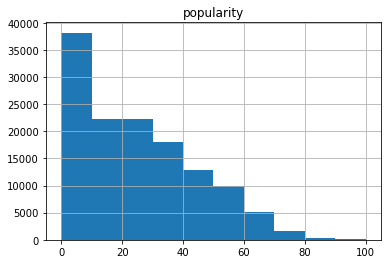

In [140]:
df.hist(column='popularity')

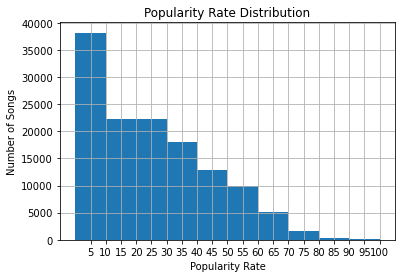

In [141]:
# Plot to know exactly where can we split popularity rate
df.hist(column='popularity')
x = [5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
plt.xticks(x)
plt.xlabel('Popularity Rate')
plt.ylabel('Number of Songs')
plt.title('Popularity Rate Distribution');

In [67]:
# 1 for popular and 0 for not popular
df['popularity']=np.where(df['popularity']>= 30, 1, 0)

Text(0.5, 1.0, 'Class balance')

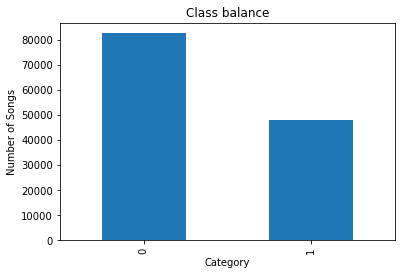

In [142]:
a.plot(kind='bar')
plt.xlabel('Category')
plt.ylabel('Number of Songs')
plt.title('Class balance')

In [71]:
text=" ".join(df["artist_name"])

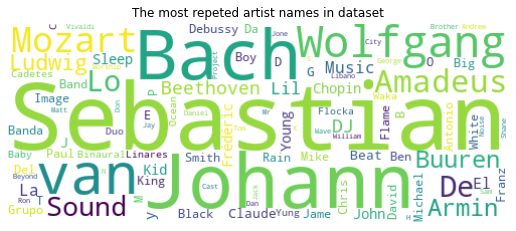

In [72]:
# Write the most reapted word in artist_name column
plt.rcParams['figure.figsize'] =9, 4
wordcloud = WordCloud(max_font_size=100, max_words=100, background_color="white",width=500, height=200,collocations=False).generate(text)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("The most repeted artist names in dataset")
plt.show();

In [34]:
x=['popular','not popular']

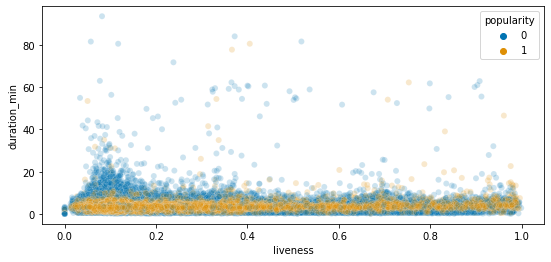

In [94]:
# Ploting duration, liveness for each category
sns.scatterplot(x='liveness', y='duration_min', data=df, hue='popularity',
           palette='colorblind', alpha=.2);

### 5- Correlation Matrix

In [37]:
df.corr()

,acousticness,danceability,energy,instrumentalness,liveness,loudness_db,speechiness,beats_per_min,mood,popularity,duration_min
acousticness,1.000000,-0.360462,-0.710067,0.272685,-0.100545,-0.603366,-0.119231,-0.216328,-0.177023,-0.116215,0.033426
danceability,-0.360462,1.000000,0.286196,-0.305112,-0.137377,0.431554,0.248192,0.081791,0.461468,0.134014,-0.126781
energy,-0.710067,0.286196,1.000000,-0.301308,0.209448,0.766697,0.105078,0.229930,0.314768,0.125193,-0.019885
instrumentalness,0.272685,-0.305112,-0.301308,1.000000,-0.058390,-0.508519,-0.217359,-0.086894,-0.246869,-0.192463,0.029124
liveness,-0.100545,-0.137377,0.209448,-0.058390,1.000000,0.062168,0.106801,-0.009126,-0.007800,-0.030739,-0.003661
loudness_db,-0.603366,0.431554,0.766697,-0.508519,0.062168,1.000000,0.074456,0.223067,0.319881,0.233854,-0.018595
speechiness,-0.119231,0.248192,0.105078,-0.217359,0.106801,0.074456,1.000000,0.054827,0.121552,-0.002789,-0.101955
beats_per_min,-0.216328,0.081791,0.229930,-0.086894,-0.009126,0.223067,0.054827,1.000000,0.104857,0.038725,-0.009657
mood,-0.177023,0.461468,0.314768,-0.246869,-0.007800,0.319881,0.121552,0.104857,1.000000,0.023247,-0.141837
popularity,-0.116215,0.134014,0.125193,-0.192463,-0.030739,0.233854,-0.002789,0.038725,0.023247,1.000000,-0.011844


#### Pairplot

In [100]:
X= df[['acousticness','danceability','energy','instrumentalness','loudness_db']]
y= df[['popularity']]

In [108]:
y.dtypes

popularity    int32
dtype: object

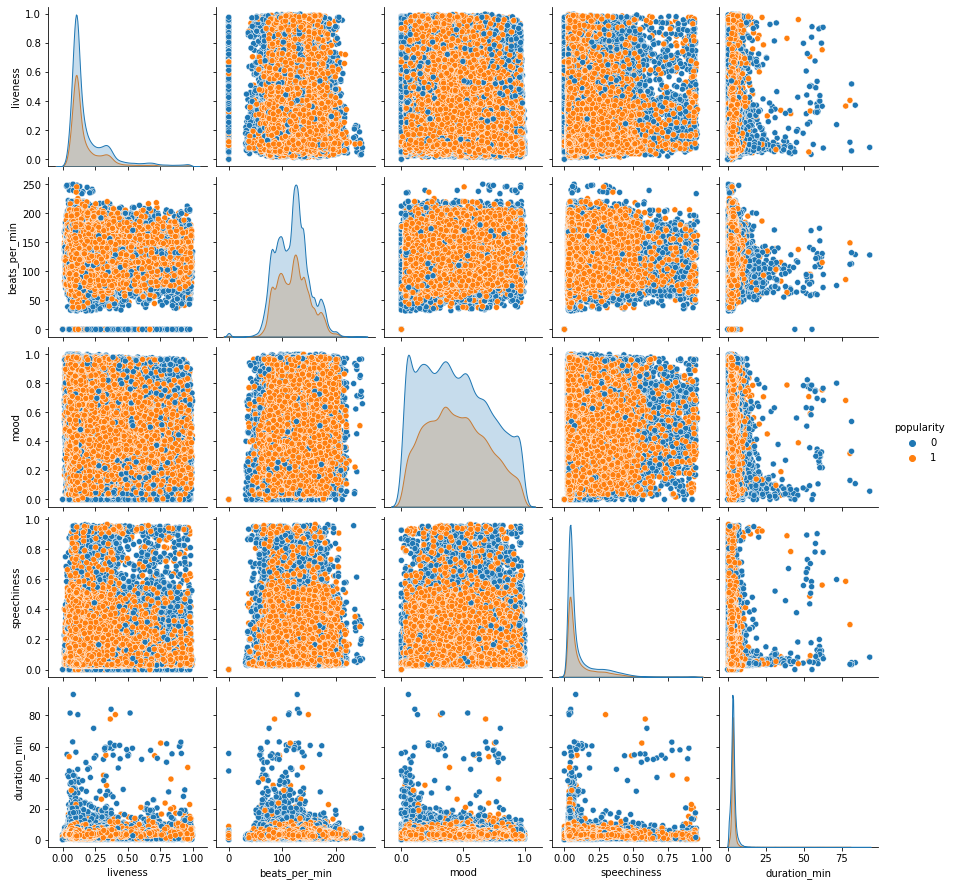

In [111]:
subset1 = df[['liveness','beats_per_min','mood','speechiness','duration_min','popularity']]
sns.pairplot(subset1, hue ='popularity')
plt.show()

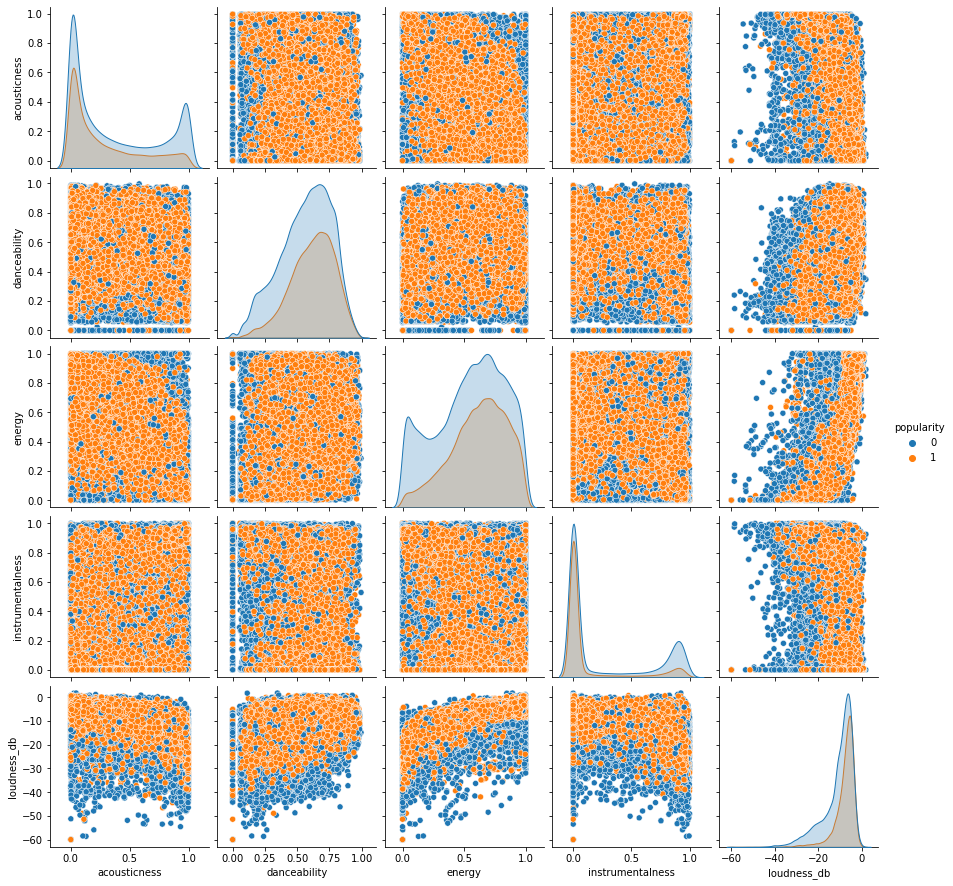

In [110]:
subset = df[['acousticness','danceability','energy','instrumentalness','loudness_db','popularity']]
sns.pairplot(subset, hue ='popularity')
plt.show()

#### Feature Importance

In [112]:
subset_X= df[['acousticness','danceability','energy','instrumentalness','loudness_db','liveness','beats_per_min','mood','speechiness','duration_min']]
subset_y= df[['popularity']]
X_scale=MinMaxScaler().fit_transform(subset_X)
X_scale

array([[0.00584337, 0.74598394, 0.339     , ..., 0.118     , 0.42339545,
        0.04194358],
       [0.02449799, 0.84939759, 0.557     , ..., 0.371     , 0.47308489,
        0.03773924],
       [0.0251004 , 0.60542169, 0.723     , ..., 0.382     , 0.04699793,
        0.02420446],
       ...,
       [0.3313253 , 0.71987952, 0.532     , ..., 0.546     , 0.21325052,
        0.02425405],
       [0.00793173, 0.7751004 , 0.51      , ..., 0.0755    , 0.1242236 ,
        0.03153483],
       [0.55120482, 0.71787149, 0.734     , ..., 0.976     , 0.03799172,
        0.02543761]])

In [113]:
df1=pd.DataFrame(X_scale)
df1

,0,1,2,3,4,5,6,7,8,9
0,0.005843,0.745984,0.339,0.000,0.846552,0.081281,0.815763,0.1180,0.423395,0.041944
1,0.024498,0.849398,0.557,0.000,0.853331,0.286286,0.636079,0.3710,0.473085,0.037739
2,0.025100,0.605422,0.723,0.000,0.875481,0.082482,0.459895,0.3820,0.046998,0.024204
3,0.029518,0.803213,0.579,0.912,0.774714,0.099499,0.492045,0.6410,0.072567,0.021791
4,0.000035,0.786145,0.792,0.878,0.804501,0.033233,0.480221,0.9280,0.068427,0.021548
...,...,...,...,...,...,...,...,...,...,...
130658,0.006807,0.603414,0.801,0.000,0.887066,0.099199,0.524232,0.2890,0.033437,0.033412
130659,0.921687,0.388554,0.249,0.000,0.756674,0.103103,0.376182,0.3460,0.045238,0.034133
130660,0.331325,0.719880,0.532,0.000,0.835663,0.099800,0.627951,0.5460,0.213251,0.024254
130661,0.007932,0.775100,0.510,0.000,0.814322,0.131131,0.480229,0.0755,0.124224,0.031535


In [114]:
df1.rename({ 0: 'acousticness',1:'danceability',2:'energy',3:'instrumentalness',4:'liveness',5:'loudness_db',6:'speechiness',7:'beats_per_min',8:'mood',9:'duration_min'}, axis=1,inplace=True)

#### The most important features

In [116]:
#apply SelectKBest to extract top 5 best features for housing df
bestfeatures = SelectKBest(score_func=chi2, k=5)
fit = bestfeatures.fit(df1,subset_y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(df1.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Features','Score']  #naming the dataframe columns
print(featureScores.nlargest(5,'Score'))  #print 5best features

           Features        Score
3  instrumentalness  2805.152114
0      acousticness   618.021449
2            energy   243.798803
1      danceability   146.393515
4          liveness    98.980442


#### Save the clean dataset as csv file 

In [84]:
df.to_csv("cleaned_music.csv")

#### This notbook for exploring , cleaning the data and plot some graphs to represent data 
Now we will foucs on modeling the data